---

**Vehicle Detection Project**

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

---


**Import**

In [2]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
from sklearn.model_selection import train_test_split
import pickle
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

#### 1. Explain how (and identify where in your code) you extracted HOG features from the training images.


**Loading Data**

In [3]:
vehicle_images = glob.glob('./data/vehicles/**/*.png')
nonvehicle_images = glob.glob('./data/non-vehicles/**/*.png')
print(len(vehicle_images), len(nonvehicle_images))

8792 8968


**Visualize some data**

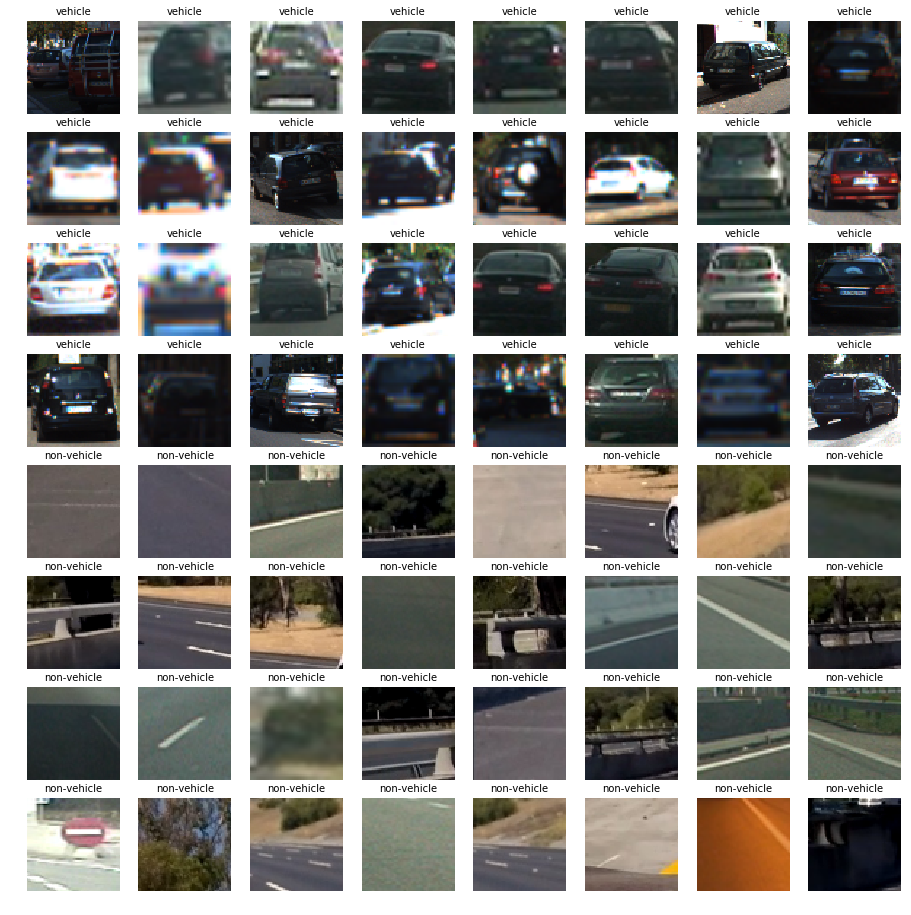

In [4]:
fig, axs = plt.subplots(8,8, figsize = (16,16))
fig.subplots_adjust(hspace = .2, wspace = .001)
axs = axs.ravel()

for i in range(32):
    img = cv2.imread(vehicle_images[np.random.randint(0,len(vehicle_images))])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('vehicle', fontsize = 10)
    axs[i].imshow(img)
    
for i in range(32, 64):
    img = cv2.imread(nonvehicle_images[np.random.randint(0,len(nonvehicle_images))])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('non-vehicle', fontsize = 10)
    axs[i].imshow(img)

**Define a funtion to convert image to histogram of oriented gradient(HOG),  compute binned color features, compute color histogram features**

In [5]:
# convert image to HOG
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis = False, feature_vec = True):
    if vis == True:
        features, hog_image = hog(img, orientations = orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                 cells_per_block = (cell_per_block,cell_per_block), transform_sqrt = True,
                                 visualise = vis, feature_vector = feature_vec)
        return features, hog_image
    else: 
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# binned color features
def bin_spatial(img, size=(32,32)):
    # Use cv2.resize().ravel() to create the feature vector
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

# color histograms features
def color_hist(img, nbins = 32): #bins_range = (0,256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histogram into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    return hist_features
    


visualize HOG

[[<matplotlib.axes._subplots.AxesSubplot object at 0x120f03748>


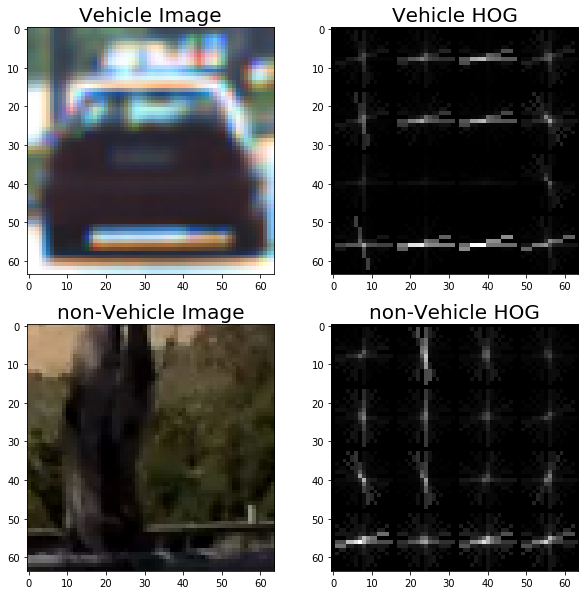

In [6]:
vehicle_img = mpimg.imread(vehicle_images[np.random.randint(0,len(vehicle_images))])
_, vehicle_hog_image = get_hog_features(vehicle_img[:,:,0],
                                        orient=12, pix_per_cell=16, cell_per_block=2, 
                                        vis = True, feature_vec = True)
nonvehicle_img = mpimg.imread(nonvehicle_images[np.random.randint(0,len(nonvehicle_images))])
_, nonvehicle_hog_image = get_hog_features(nonvehicle_img[:,:,0], 
                                           orient=12, pix_per_cell=16, cell_per_block=2, 
                                           vis = True, feature_vec = True)
fig, axs = plt.subplots(2,2, figsize = (10,10))
print(axs)
axs[0][0].set_title('Vehicle Image', fontsize=20)
axs[0][0].imshow(vehicle_img)
axs[0][1].set_title('Vehicle HOG', fontsize=20)
axs[0][1].imshow(vehicle_hog_image, cmap ='gray')
axs[1][0].set_title('non-Vehicle Image', fontsize=20)
axs[1][0].imshow(nonvehicle_img)
axs[1][1].set_title('non-Vehicle HOG', fontsize=20)
axs[1][1].imshow(nonvehicle_hog_image, cmap ='gray')

**Define a function to extract features form a list of images**

In [7]:
def extract_features(imgs, cspace = 'RGB', spatial_size =(32,32),
                     hist_bins=32, orient = 9,
                     pix_per_cell = 8, cell_per_block = 2, hog_channel = 0,
                     spatial_feat = True, hist_feat = True, hog_feat = True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # Apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif cspace == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: 
            feature_image = np.copy(image)

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size = spatial_size)
            file_features.append(spatial_features)
            
        if hist_feat == True:
            hist_features = color_hist(feature_image, nbins = hist_bins)
            file_features.append(hist_features)
            
        if hog_feat == True:
            # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel],
                                                        orient, pix_per_cell, cell_per_block,
                                                        vis = False, feature_vec =True))
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, pix_per_cell, cell_per_block,
                                                vis = False, feature_vec = True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
            
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features
            

**Tweek parameters and see how thre result change**

In [11]:
# Feature parameters
colorspace = 'YCrCb'
orient = 12
pix_per_cell = 16
cell_per_block = 2
hog_channel = 'ALL'
spatial_size = (16,16) # Spatial bining dimensions
hist_bins = 16 # Number of histogram bins
spatial_feat =  True
hist_feat = True
hog_feat = True


t = time.time()
# number of test 
n_samples = 1000
random_idxs = np.random.randint(0,len(vehicle_images), n_samples)
test_vehicle = vehicle_images# np.array(vehicle_images)[random_idxs]
test_nonvehicle = nonvehicle_images# np.array(nonvehicle_images)[random_idxs]



vehicle_features = extract_features(test_vehicle, cspace=colorspace, 
                                    spatial_size = spatial_size, hist_bins = hist_bins, 
                                    orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,
                                    hog_channel=hog_channel, spatial_feat = spatial_feat,
                                    hist_feat=hist_feat, hog_feat=hog_feat)
nonvehicle_features = extract_features(test_nonvehicle, cspace=colorspace, 
                                    spatial_size = spatial_size, hist_bins = hist_bins, 
                                    orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,
                                    hog_channel=hog_channel, spatial_feat = spatial_feat,
                                    hist_feat=hist_feat, hog_feat=hog_feat)
t2 = time.time()
print(round(t2 - t, 2), 'Seconds to extract HOG features...')

# Create an aray stack of feature vectors
X = np.vstack((vehicle_features, nonvehicle_features)).astype(np.float64)
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(vehicle_features)), np.zeros(len(nonvehicle_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0,100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size =0.2,
                                                   random_state=rand_state)

print('Using:', orient, 'orientatiosn', pix_per_cell,
     'pixels per cell and', cell_per_block, 'cells per block')
print('Using spatial spampling:', spatial_size,
    'and', hist_bins,'histogram bins')
print('Feature vector length: ', len(X_train[0]))

80.28 Seconds to extract HOG features...
Using: 12 orientatiosn 16 pixels per cell and 2 cells per block
Using spatial spampling: (16, 16) and 16 histogram bins
Feature vector length:  2112


**Train a Classifier**

In [18]:
# Use a linear SVC
svc = LinearSVC()

# Check the training time for the SVC
t = time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

# save featuring and training parmeters and  in pickle
svm_pickle = {}
svm_pickle["colorspace"] = colorspace
svm_pickle["svc"] = svc
svm_pickle["scaler"] = X_scaler
svm_pickle["orient"] = orient
svm_pickle["pix_per_cell"] = pix_per_cell
svm_pickle["cell_per_block"] = cell_per_block
svm_pickle["spatial_size"] = spatial_size
svm_pickle["hist_bins"]= hist_bins
pickle.dump(svm_pickle, open('data/svm_pickle.p', 'wb'))

4.17 Seconds to train SVC...
Test Accuracy of SVC =  0.991
My SVC predicts:  [ 1.  1.  0.  1.  1.  1.  1.  0.  0.  0.]
For these 10 labels:  [ 1.  1.  0.  1.  1.  1.  1.  0.  0.  0.]
0.00182 Seconds to predict 10 labels with SVC


**Sliding Window Search**

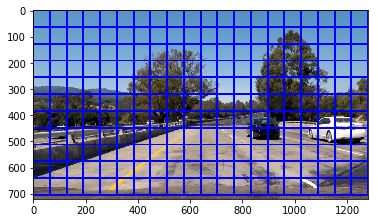

In [19]:
image = mpimg.imread('./test_images/test1.jpg')

# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    
    random_color = False
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        if color == 'random' or random_color==True:
            color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
            random_color = True
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy
    
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]        
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows  = np.int((xspan - nx_buffer)/nx_pix_per_step)
    ny_windows  = np.int((yspan - ny_buffer)/ny_pix_per_step)
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    #     Note: you could vectorize this step, but in practice
    #     you'll be considering windows one by one with your
    #     classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate each window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy))) 
    # Return the list of windows
    return window_list

windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(128, 128), xy_overlap=(0.5, 0.5))
                       
window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=6)                    
plt.imshow(window_img)

** extract feature from a single image windows and search through window**

In [20]:
def single_img_features(img, color_space = 'RGB', spatial_size = (32,32),
                        hist_bins = 32, orient = 9, pix_per_cell = 8,
                        cell_per_block = 2, hog_channel=0,
                        spatial_feat = True, hist_feat = True, hog_feat = True,
                        vis=False):
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
#                 hog_features, hog_image = get_hog_features(feature_image[:,:,channel], 
#                                     orient, pix_per_cell, cell_per_block, 
#                                     vis=True, feature_vec=True)
#                 plt.imshow(hog_image, cmap = 'gray')
#                 hog_features.extend(hog_features)
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows
    

0.0 1.0
0.30487 seconds to process one image searching 57 windows.
0.0 1.0
0.30521 seconds to process one image searching 57 windows.
0.0 1.0
0.30411 seconds to process one image searching 57 windows.
0.0 1.0
0.29747 seconds to process one image searching 57 windows.
0.0 1.0
0.30991 seconds to process one image searching 57 windows.
0.0 1.0
0.30576 seconds to process one image searching 57 windows.


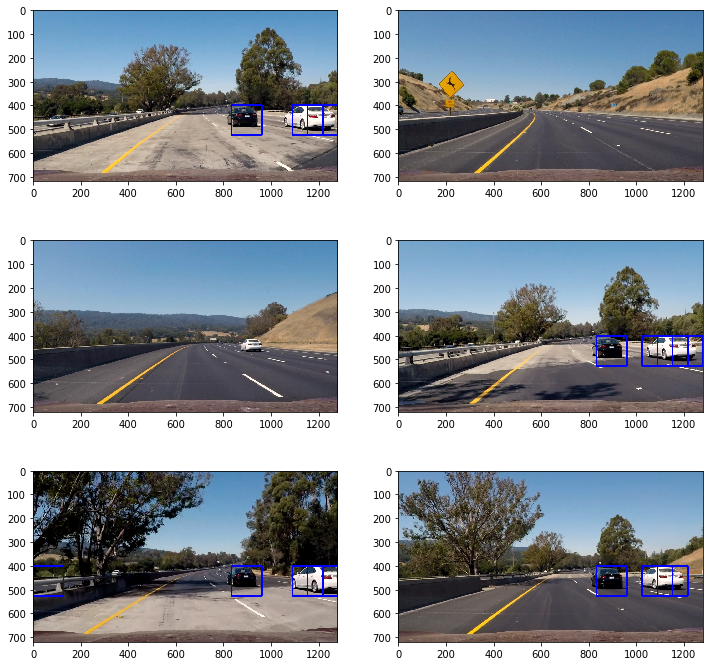

In [21]:
test_images = glob.glob('./test_images/*.jpg')
window_images = []
y_start_stop = [400, 656] # Min and max in y to search in slide_window()
xy_overlap = (0.5,0.5)
xy_window = (128, 128)
for img_src in test_images:
    t1 = time.time()
    image = mpimg.imread(img_src)
    draw_image = np.copy(image)
    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    image = image.astype(np.float32)/255
    print(np.min(image), np.max(image))


    windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                           xy_window=xy_window, xy_overlap=xy_overlap)

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=colorspace, 
                                 spatial_size=spatial_size, hist_bins=hist_bins, 
                                 orient=orient, pix_per_cell=pix_per_cell, 
                                 cell_per_block=cell_per_block, 
                                 hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                 hist_feat=hist_feat, hog_feat=hog_feat)                       

    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    
    window_images.append(window_img)
    print(round(time.time()-t1,5), 'seconds to process one image searching', len(windows), 'windows.')
fig, axs = plt.subplots(3,2, figsize = (12,12))
axs[0][0].imshow(window_images[0])
axs[0][1].imshow(window_images[1])
axs[1][0].imshow(window_images[2])
axs[1][1].imshow(window_images[3])
axs[2][0].imshow(window_images[4])
axs[2][1].imshow(window_images[5])
          

** HOG Sub-sampling Window Search **

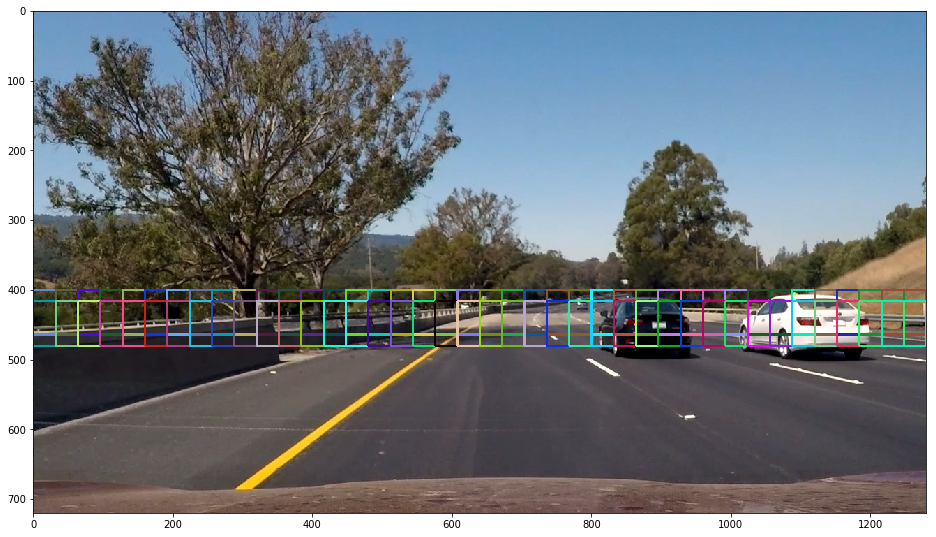

In [22]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
              pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = False):
    # array of rectangles where cars were detected
    rectangles = []
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
#     nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
#     nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1
    nxblocks = (ch1.shape[1] // pix_per_cell) + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) + 1
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1 or show_all_rectangles:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                rectangles.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
#                 cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                
    return rectangles

dist_pickle = pickle.load( open("./data/svm_pickle.p", "rb" ) )
svc = dist_pickle["svc"]
X_scaler = dist_pickle["scaler"]
orient = dist_pickle["orient"]
pix_per_cell = dist_pickle["pix_per_cell"]
cell_per_block = dist_pickle["cell_per_block"]
spatial_size = dist_pickle["spatial_size"]
hist_bins = dist_pickle["hist_bins"]

img = mpimg.imread('./test_images/test6.jpg')
rectangles = []
ystart = 400
scale = 1.0
ystop = ystart + int(scale*64)
rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                            pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = True))

ystart = 416
scale = 1.0
ystop = ystart + int(scale*64)
rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                            pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = True))

rectangles = [item for sublist in rectangles for item in sublist] 

img_rects = np.copy(img)
img_rects = draw_boxes(img_rects, rectangles, color='random', thick=2)
plt.figure(figsize = (16,16))
plt.imshow(img_rects)
plt.show()


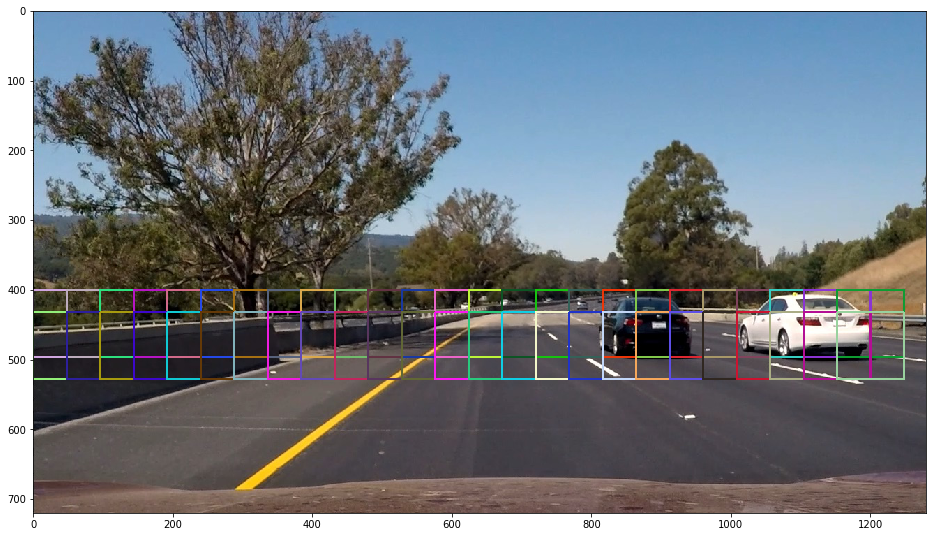

In [23]:
rectangles = []
ystart = 400
scale = 1.5 
ystop = ystart + int(scale*64)
rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                            pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = True))

ystart = 432
scale = 1.5 
ystop = ystart + int(scale*64)
rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = True))

rectangles = [item for sublist in rectangles for item in sublist] 

img_rects = np.copy(img)
img_rects = draw_boxes(img_rects, rectangles, color='random', thick=2)
plt.figure(figsize = (16,16))
plt.imshow(img_rects)
plt.show()

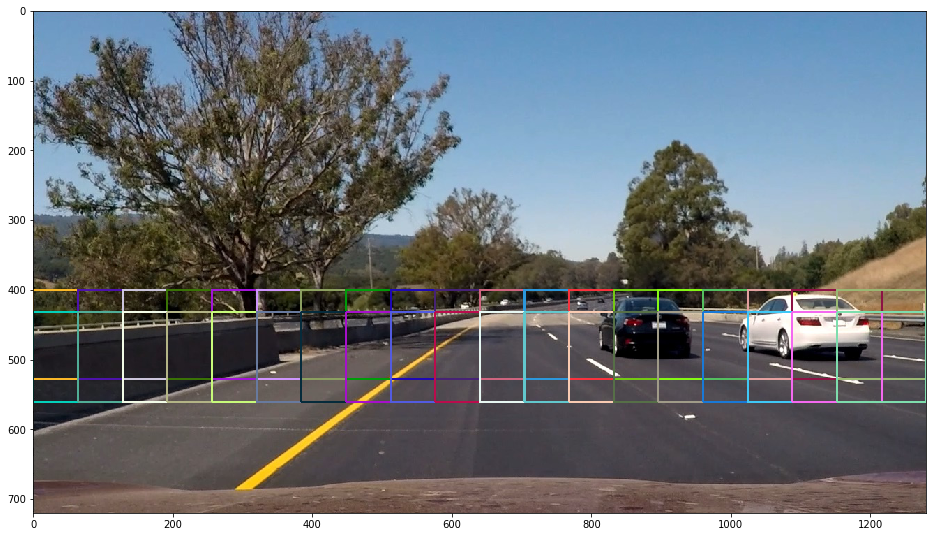

In [24]:
rectangles = []
ystart = 400
scale = 2.0
ystop = ystart + int(scale*64)
rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                            pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = True))

ystart = 432
scale = 2.0 
ystop = ystart + int(scale*64)
rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = True))

rectangles = [item for sublist in rectangles for item in sublist] 

img_rects = np.copy(img)
img_rects = draw_boxes(img_rects, rectangles, color='random', thick=2)
plt.figure(figsize = (16,16))
plt.imshow(img_rects)
plt.show()

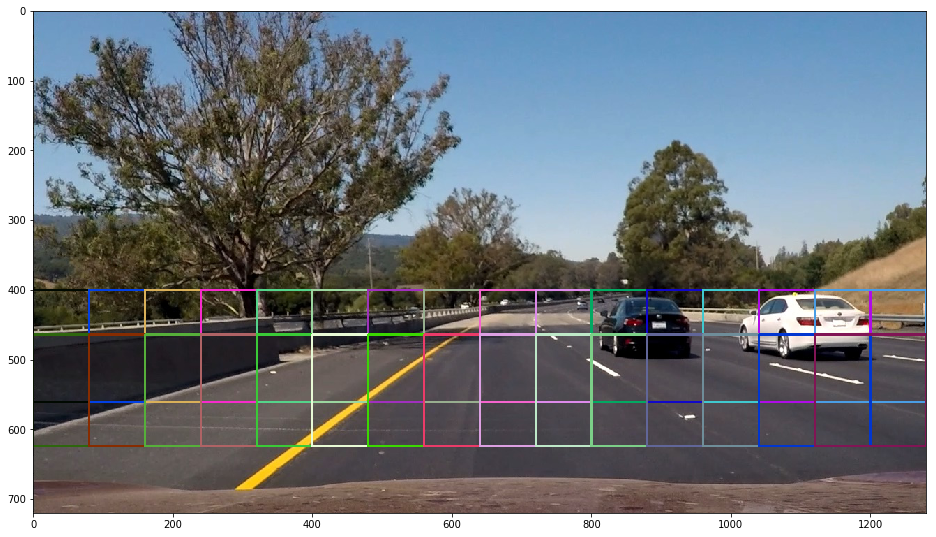

In [25]:
rectangles = []
ystart = 400
scale = 2.5
ystop = ystart + int(scale*64)
rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                            pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = True))

ystart = 464
scale = 2.5
ystop = ystart + int(scale*64)
rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = True))

rectangles = [item for sublist in rectangles for item in sublist] 

img_rects = np.copy(img)
img_rects = draw_boxes(img_rects, rectangles, color='random', thick=2)
plt.figure(figsize = (16,16))
plt.imshow(img_rects)
plt.show()

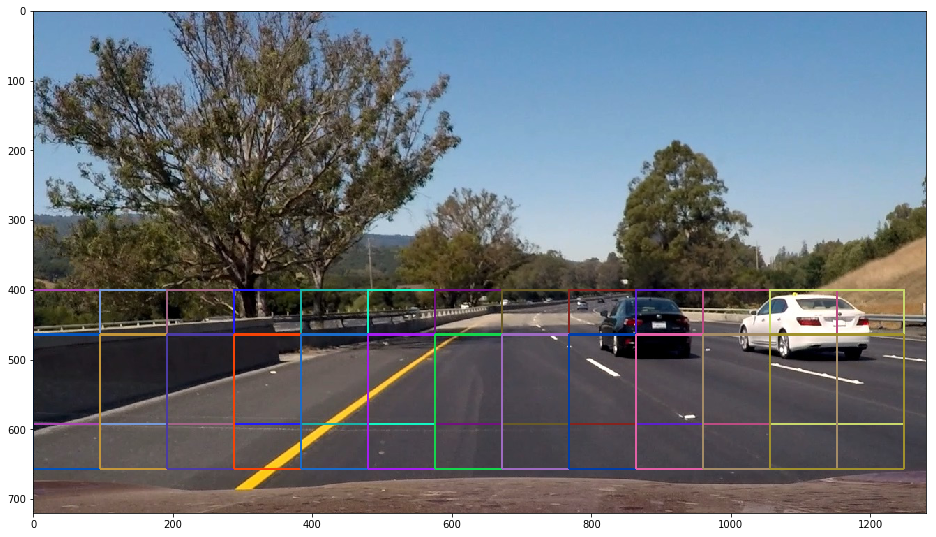

In [26]:
rectangles = []
ystart = 400
scale = 3.0
ystop = ystart + int(scale*64)
rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                            pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = True))

ystart = 464
scale = 3.0
ystop = ystart + int(scale*64)
rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles = True))

rectangles = [item for sublist in rectangles for item in sublist] 

img_rects = np.copy(img)
img_rects = draw_boxes(img_rects, rectangles, color='random', thick=2)
plt.figure(figsize = (16,16))
plt.imshow(img_rects)
plt.show()

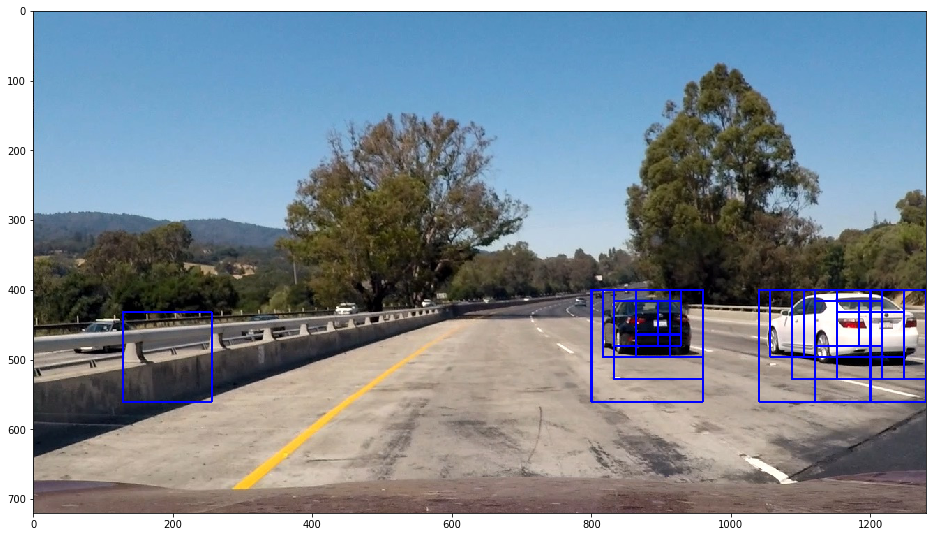

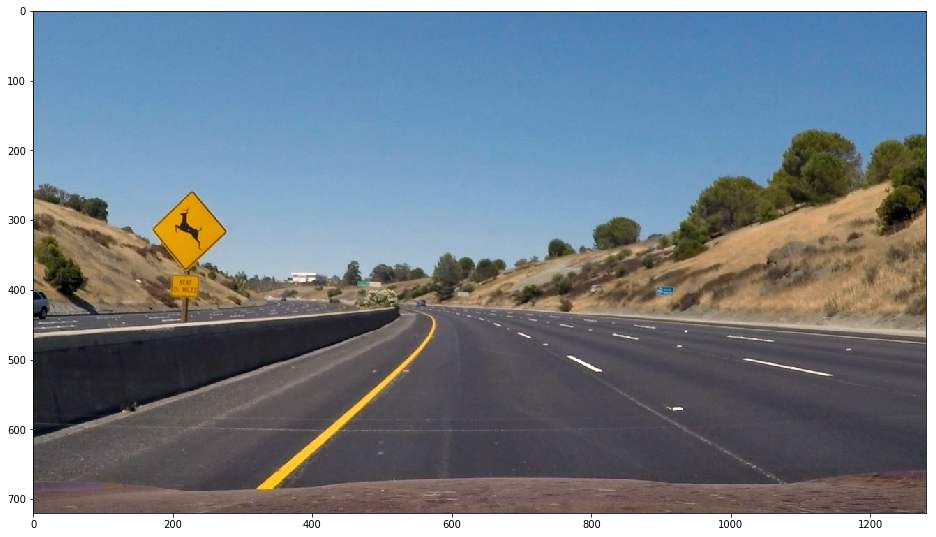

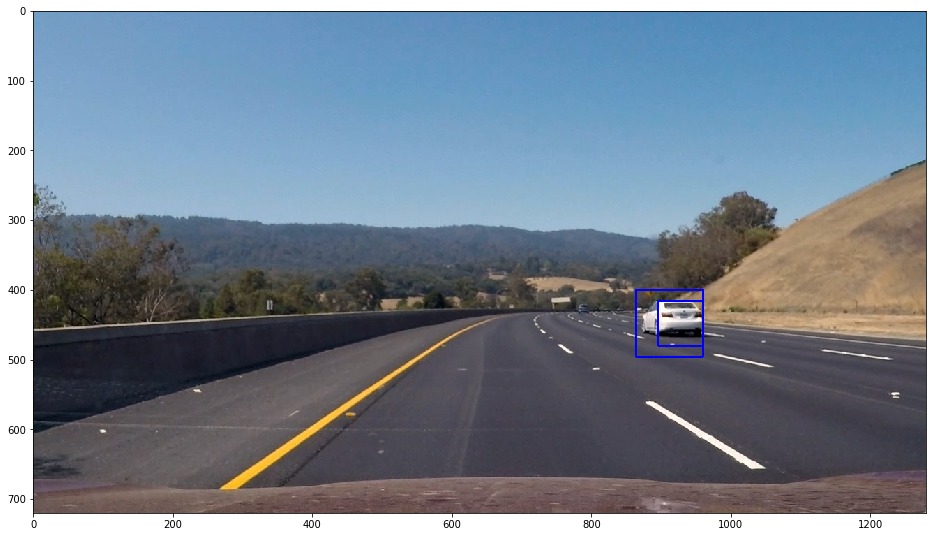

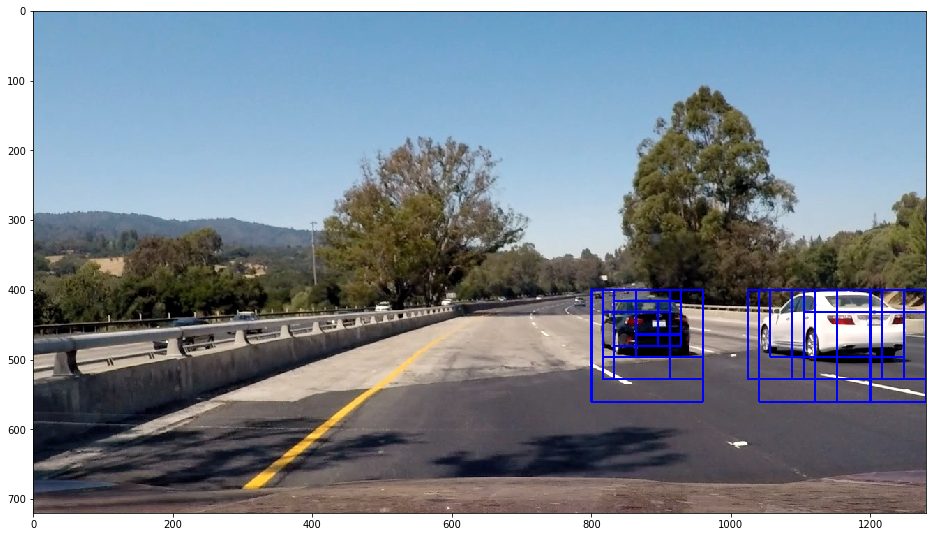

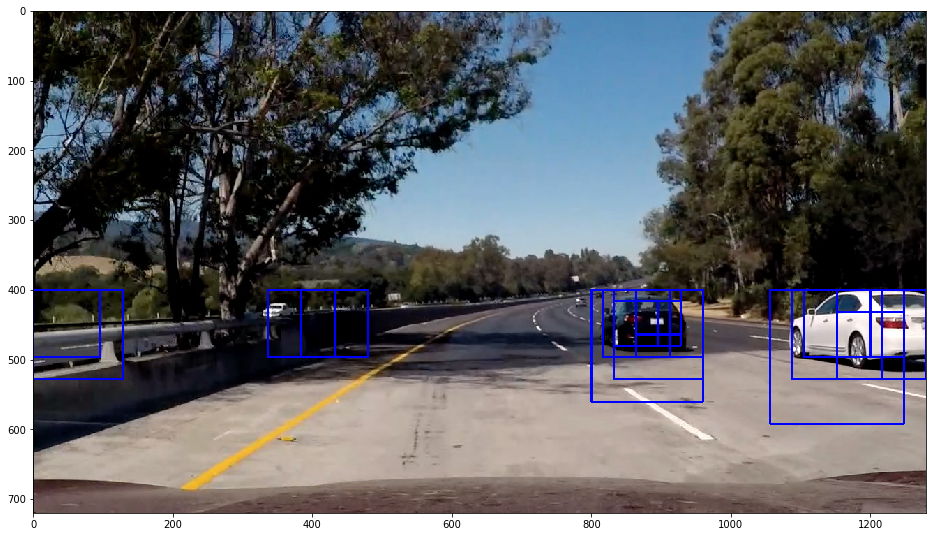

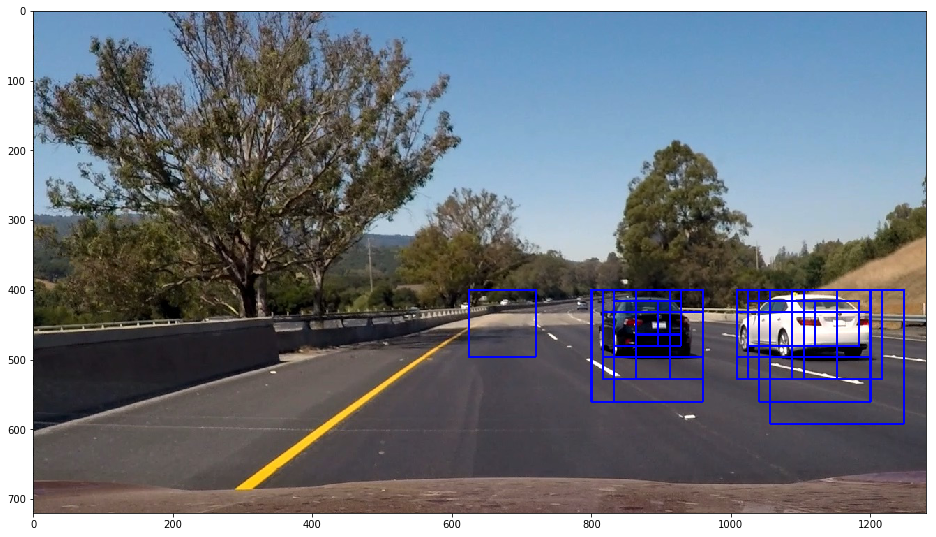

In [27]:
test_images = glob.glob('./test_images/*.jpg')

for img_src in test_images:
    img = mpimg.imread(img_src)
    rectangles = []

    ystart = 400
    scale = 1.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 416
    scale = 1.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))
    
    ystart = 400
    scale = 1.5
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 432
    scale = 1.5
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    ystart = 400
    scale = 2.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 432
    scale = 2.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    ystart = 400
    scale = 2.5
    ystop = ystart + int(scale*64) 
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 464
    scale = 2.5
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    ystart = 400
    scale = 3.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 464
    scale = 3.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    rectangles = [item for sublist in rectangles for item in sublist] 

    img_rects = np.copy(img)
    img_rects = draw_boxes(img_rects, rectangles, color=(0,0,255), thick=2)
    plt.figure(figsize = (16,16))
    plt.imshow(img_rects)
    plt.show()

**Heatmap and Threshold**

In [28]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

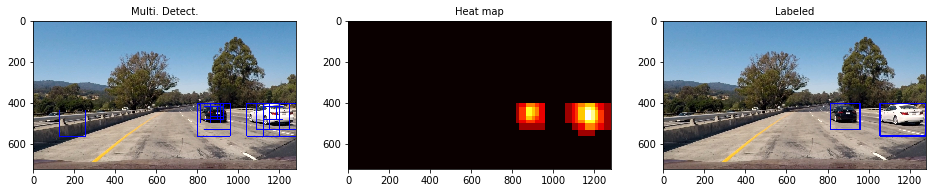

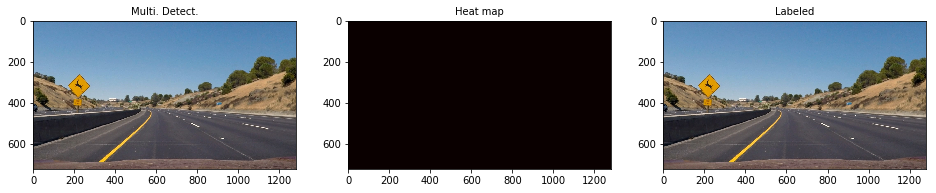

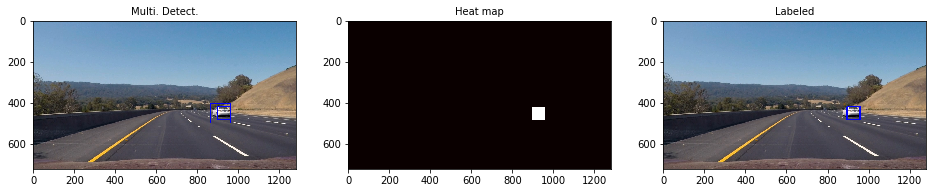

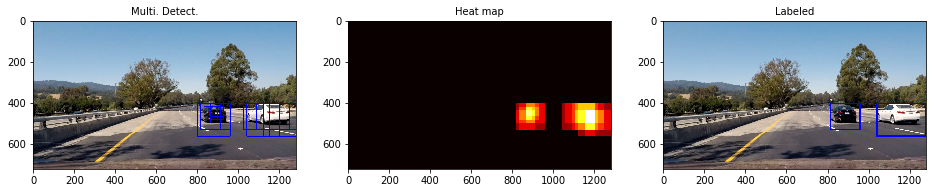

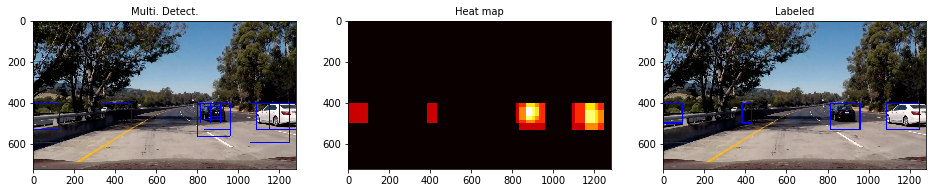

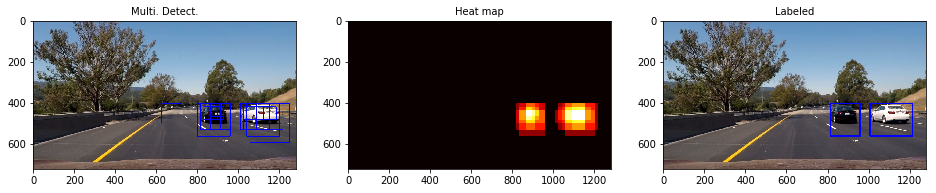

In [29]:
for img_src in test_images:
    img = mpimg.imread(img_src)
    rectangles = []

    ystart = 400
    scale = 1.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 416
    scale = 1.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))
    
    ystart = 400
    scale = 1.5
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 432
    scale = 1.5
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    ystart = 400
    scale = 2.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 432
    scale = 2.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    ystart = 400
    scale = 2.5
    ystop = ystart + int(scale*64) 
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 464
    scale = 2.5
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    ystart = 400
    scale = 3.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 464
    scale = 3.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    rectangles = [item for sublist in rectangles for item in sublist] 
    
    fig, axs = plt.subplots(1,3, figsize = (16,16))
    axs = axs.ravel()    

    img_rects = np.copy(img)
    img_rects = draw_boxes(img_rects, rectangles, color=(0,0,255), thick=2)
#     axs[0].axis('off')
    axs[0].set_title('Multi. Detect.', fontsize = 10)
    axs[0].imshow(img_rects)       
    
    
    heat = np.zeros_like(img[:,:,0]).astype(np.float)    
    # Add heat to each box in box list
    heat = add_heat(heat,rectangles)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
#     axs[0].axis('off')
    axs[1].set_title('Heat map', fontsize = 10)
    axs[1].imshow(heatmap, cmap='hot')    
    
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
#     plt.figure(figsize = (16,16))
#     plt.imshow(draw_img)
    axs[2].set_title('Labeled', fontsize = 10)
    axs[2].imshow(draw_img)        

** Define a class to store data and smooth detection**

In [30]:
class vehicle_detection():
    def __init__(self):
        # history of rectangules for the most recent detections
        self.current_rects = []
        
    def add_rects(self, rectangles):
        n = 10 # the number of newesst fits kept in the class
        self.current_rects.append(rectangles)
        if len(self.current_rects) > n:
            self.current_rects = self.current_rects[len(self.current_rects)-n:]

** Build a pipeline** 

In [31]:
v_detect = vehicle_detection()

def process_frame(img):
    rectangles = []

    ystart = 400
    scale = 1.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 416
    scale = 1.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))
    
    ystart = 400
    scale = 1.5
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 432
    scale = 1.5
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    ystart = 400
    scale = 2.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 432
    scale = 2.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    ystart = 400
    scale = 2.5
    ystop = ystart + int(scale*64) 
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 464
    scale = 2.5
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    ystart = 400
    scale = 3.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, 
                                pix_per_cell, cell_per_block, spatial_size, hist_bins))

    ystart = 464
    scale = 3.0
    ystop = ystart + int(scale*64)
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient,
                                pix_per_cell, cell_per_block, spatial_size, hist_bins,)) 
    
    rectangles = [item for sublist in rectangles for item in sublist] 
    
    # add detection to the history in class
    if len(rectangles) > 0:
        v_detect.add_rects(rectangles)
    
    img_rects = np.copy(img)
    img_rects = draw_boxes(img_rects, rectangles, color=(0,0,255), thick=2)
    heat = np.zeros_like(img[:,:,0]).astype(np.float)    
    # Add heat to each box in box list
    for rectangles in v_detect.current_rects:
        heat = add_heat(heat,rectangles)
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, 5 + len(v_detect.current_rects)//2)
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)    
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    return draw_img
    

In [32]:
v_detect = vehicle_detection()

test_out_file = 'test_video_out.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(process_frame)
%time clip_test_out.write_videofile(test_out_file, audio=False)

[MoviePy] >>>> Building video test_video_out.mp4
[MoviePy] Writing video test_video_out.mp4


 97%|█████████▋| 38/39 [00:25<00:00,  1.49it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out.mp4 

CPU times: user 23.7 s, sys: 2.4 s, total: 26.1 s
Wall time: 26.1 s


In [33]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_out_file))

In [34]:
v_detect = vehicle_detection()

project_out_file = 'project_video_out.mp4'
clip_test = VideoFileClip('project_video.mp4')
clip_test_out = clip_test.fl_image(process_frame)
%time clip_test_out.write_videofile(project_out_file, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [13:56<00:00,  1.50it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 13min 1s, sys: 1min 19s, total: 14min 21s
Wall time: 13min 57s


In [35]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_out_file))